# MTH 4326 / 5326 — Explainable AI  
Homework 1: Differential Explanations and Curvature
## by Candela Solis Zampini

## I. First-Order vs. Second-Order Differential Explanations

### Problem 1. Differential Explanations as First-Order Approximations

Let $f : \mathbb{R}^d \to \mathbb{R}$ be twice differentiable at a point $x_0$.

a. Write the second-order Taylor expansion of $f(x_0 + \delta x)$ about $x_0$, clearly identifying each term.

b. State precisely what class of functions would be *perfectly* explained by a gradient explanation, in the sense that the first-order approximation is exact. Prove your claim.


a. The second-order Taylor expansion of $f(x_0 + \delta x)$ about $x_0$ is 
$$f(x_0 + \delta x) = f(x_0) + \nabla f(x_0)^T \delta x + \frac{1}{2} \delta x^T H_f(x_0) \delta x + o(\|\delta x\|^2)$$  
as  $$(\|\delta\|) → 0$$ 

The zeroth-order is the baseline point: $f(x_0)$

The first-order of the Taylor expansion approximates the change of $f$ by a linear function of the perturbation $\delta$: $\nabla f(x_0)^T \delta $

The second-order expression as a quadratic term that accounts for the curvature of $f$ near $x$: $\frac{1}{2} \delta x^T H_f(x_0) \delta x$

The remainder is the little-o or the error term where: $lim_{\delta x \to 0} \frac{o(\|\delta x\|^2)}{\|\delta x\|^2} = 0$

-----------

b. To determine that the first-order approximation is exact we need to set all the other terms in the equation, that aren't the first-order components, to 0. 

Meaning that:

$$\frac{1}{2} \delta x^T H_f(x_0) \delta x = 0$$
   and   $$o(\|\delta x\|^2)=0$$

Therefore, $$f(x_0 + \delta x) = f(x_0) + \nabla f(x_0)^T \delta x $$



If we set $H_f(x)=0$ for all $x \in \mathbb{R}^d$
,  all second order partial derivatives are also zero. 
$$\frac{\partial^2 f}{\partial x_i \partial x_j}(x) = 0$$
This make each of the first order partial derivatives to be constant
$$\frac{\partial f}{\partial x_i}(x) = c_i  \quad \text{and, if we integrate it we get }  $$
$$ f(x) = c_1 x_1 + c_2 x_2 + \cdots + c_d x_d + c_0$$
which makes $$\nabla f(x) =c $$

Therefore, the first-order approximation is exact if and only if
$$
f(x) = c^T x + c_0
$$
when $f$ is an affine function. In this case, the gradient is constant and the gradient explanation perfectly captures the behavior of $f$.


------
----

### Problem 2. Curvature, Stability, and Scalarization

Define the directional second derivative

$$
\kappa(v) = v^\top H_f(x_0)\, v,
\qquad \|v\| = 1.
$$

a. Show that if $\kappa(v) = 0$, then the gradient explanation along direction $v$ is locally stable to second order.

b. Show that large $|\kappa(v)|$ implies that the linear explanation changes rapidly under finite perturbations along $v$.

Now let $g : \mathbb{R}^k \to \mathbb{R}$ be a scalarization and define

$$
h(x) = g(f(x)).
$$

c. Write an expression for $H_h(x)$ in terms of $\nabla f(x)$, $H_f(x)$, and derivatives of $g$.

---

a. 
Then second-order Taylor expansion gives

$$f(x_0 + \delta x) = f(x_0) + \nabla f(x_0)^T \delta x + \frac{1}{2} \delta x^T H_f(x_0) \delta x + o(\|\delta x\|^2)$$  

If we use the one dimensional restriction, 

$$
x = x_0 + \epsilon v.
$$
 it becomes

$$
f(x_0 + \epsilon v)
=
f(x_0)
+
\epsilon \nabla f(x_0)^T v
+
\frac{1}{2}\epsilon^2 v^T H_f(x_0) v
+
o(\epsilon^2).
$$

If we subtitute it with the curvature,
$$
f(x_0 + \epsilon v)
=
f(x_0)
+
\epsilon \nabla f(x_0)^T v
+
\frac{1}{2}\epsilon^2 \kappa(v)
+
o(\epsilon^2)
$$


then $\kappa(v)=v^T H_f(x_0)v=0$, the second-order term vanishes:
$$
f(x_0 + \epsilon v)
=
f(x_0)
+
\epsilon \nabla f(x_0)^T v
+
o(\epsilon^2).
$$

Therefore, the gradient explanation along direction $v$ is locally stable to second order.


---

b. If we start with the previous curvature equation,
$$
f(x_0 + \epsilon v)
=
f(x_0)
+
\epsilon \nabla f(x_0)^T v
+
\frac{1}{2}\epsilon^2 v^T H_f(x_0)v
+
o(\epsilon^2).
$$

Substituting $\kappa(v)=v^T H_f(x_0)v$ and assuming $\|v\|=1$, we obtain
$$
f(x_0 + \epsilon v)
=
f(x_0)
+
\epsilon \nabla f(x_0)^T v
+
\frac{1}{2}\epsilon^2 \kappa(v)
+
o(\epsilon^2).
$$

The gradient explanation gives out only the linear term
$$
f(x_0) + \epsilon \nabla f(x_0)^T v,
$$
while the deviation is dominated by the quadratic term
$$
\frac{1}{2}\epsilon^2 \kappa(v).
$$

If $|\kappa(v)|$ is large, then quadratic terms becomes significant for finite $\epsilon$,
$$
\left| \frac{1}{2}\epsilon^2 \kappa(v) \right|
\gg
\left| \epsilon \nabla f(x_0)^T v \right|
$$

Then we can state that,
$$
f(x_0 + \epsilon v)
\neq
f(x_0) + \epsilon \nabla f(x_0)^T v
\quad \text{for finite } \epsilon,
$$
meaning that the linear explanation changes rapidly under finite perturbations along $v$.


---

c. if we let $h(x)=g(f(x))$.

By the chain rule,
$$
\nabla h(x) = g'(f(x))\,\nabla f(x).
$$

if we differentiate one more time we get,
$$
H_h(x)
=
g''(f(x))\,\nabla f(x)\nabla f(x)^T
+
g'(f(x))\,H_f(x).
$$
In conclusion, scalarization can introduce curvature and instability in gradient explanations, even when the original function is linear.


---
---

### Problem 3. Second-Order Explanations on MNIST (15 points)

In this problem, you will compute and interpret second-order explanations using the Hessian of the model output with respect to the input.

You must use the MNIST dataset and train a neural network classifier with scalarization given by the maximum class score as the output.  
Assume batch size = 1 for all Hessian computations.

Use softplus activations so that second derivatives are well-defined.

a. Train or load a neural network on MNIST with softplus nonlinearities, and fix a correctly classified input image
   $x_0 \in \mathbb{R}^{28 \times 28}$ with scalar output $f(x)$.

b. Using PyTorch automatic differentiation, compute the full Hessian
   
   $$H_f(x_0) = \nabla_x^2 f(x_0)$$
   
   with respect to the input $x$.

c. Plot the spectrum of eigenvalues of $H_f(x_0)$ and interpret:
   - the sign of the eigenvalues,
   - the magnitude of the eigenvalues,
   - and whether the local geometry near $x_0$ is closer to locally flat, locally convex/concave, or strongly anisotropic.

d. Repeat this analysis using the same network architecture but replacing softplus activations with ReLU.
   Contrast the source of explanation instability in each case.

Training in progress
Epoch 1 completed
Epoch 1 completed
Epoch 1 completed


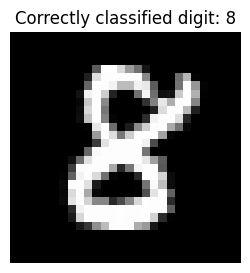

Computing Hessian ...
Eigenvalue statistics:
Count: 784
Min: -2.131339
Max: 0.9680576
Mean: -0.009495045


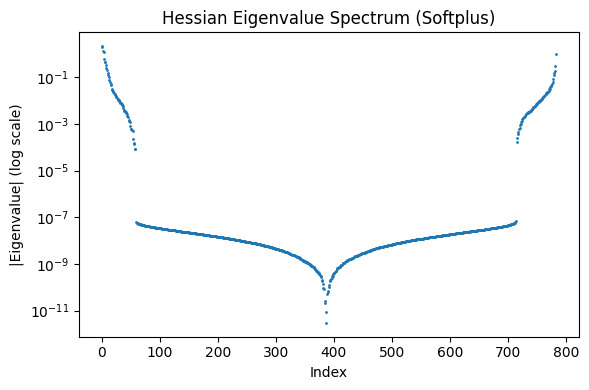

Done. Outputs saved in ./outputs/
Training ReLU network...
Epoch 1 completed
Epoch 2 completed
Epoch 3 completed


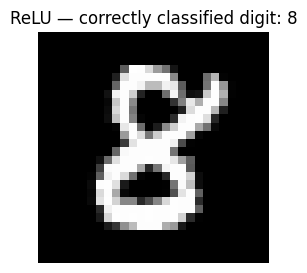

Computing Hessian (ReLU)...
ReLU Hessian eigenvalue statistics:
Count: 784
Min: 0.0
Max: 0.0
Mean: 0.0


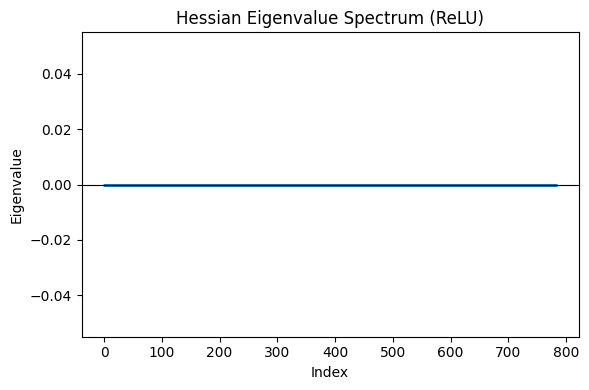

 ReLU Hessian Completed


In [26]:

#MNIST Second-Order Explanations
#Problem 3 a-c

#Libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import os


#Setup
device = "cpu"
os.makedirs("outputs", exist_ok=True)
g = torch.Generator()
g.manual_seed(torch.seed()) 


#(a) Neural Network with Softplus nonlinearities

class SoftplusNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(28 * 28, 128),
            nn.Softplus(),
            nn.Linear(128, 64),
            nn.Softplus(),
            nn.Linear(64, 10)
        )

    def forward(self, x):
        return self.net(x)

model = SoftplusNet().to(device)


#Load database MNIST

transform = transforms.ToTensor()

train_dataset = datasets.MNIST(
    root="./data", train=True, download=True, transform=transform
)
test_dataset = datasets.MNIST(
    root="./data", train=False, download=True, transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True, generator=g) #Random number



#Training

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

print("Training in progress")
model.train()
for epoch in range(3):
    for x, y in train_loader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        loss = criterion(model(x), y)
        loss.backward()
        optimizer.step()
    print(f"Epoch {+1} completed")


#Select correctly classified test image x0

model.eval()
x0, y0 = None, None

with torch.no_grad():
    for x, y in test_loader:
        x, y = x.to(device), y.to(device)
        pred = model(x).argmax(dim=1)
        if pred.item() == y.item():
            x0 = x.clone()
            y0 = y.item()
            break

assert x0 is not None, "No correctly classified test image"


#Display the image 

img = x0.detach().cpu().squeeze()

plt.figure(figsize=(3,3))
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.title(f"Correctly classified digit: {y0}")
plt.show()

# Save image
plt.figure(figsize=(3,3))
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.savefig("outputs/selected_image.png", dpi=150, bbox_inches="tight")
plt.close()

#Define scalar function f(x)

x0.requires_grad_(True)

def f(x):
    logits = model(x)
    return logits.max(dim=1).values.squeeze()

# (b) Compute full Hessian H_f(x0) = ∇²_x f(x0)
print("Computing Hessian ...")


# First derivative ∇f(x0)
output = f(x0)
grad = torch.autograd.grad(output, x0, create_graph=True)[0]
grad_flat = grad.view(-1)

n = grad_flat.numel()
H = torch.zeros(n, n, device=device)



# Second derivatives: compute each row of Hessian
for i in range(n):
    second_grad = torch.autograd.grad(
        grad_flat[i], x0, retain_graph=True
    )[0]
    H[i] = second_grad.view(-1)

H = H.detach().cpu().numpy()


# Eigenvalues calculation 

eigenvalues = np.linalg.eigvalsh(H)

print("Eigenvalue statistics:")
print("Count:", eigenvalues.shape[0])
print("Min:", eigenvalues.min())
print("Max:", eigenvalues.max())
print("Mean:", eigenvalues.mean())


#Plot of eigenvalue spectrum log scale

plt.figure(figsize=(6,4))
plt.semilogy(np.abs(eigenvalues) + 1e-12, ".", markersize=2)
plt.title("Hessian Eigenvalue Spectrum (Softplus)")
plt.xlabel("Index")
plt.ylabel("|Eigenvalue| (log scale)")
plt.tight_layout()
plt.show()
print("Done. Outputs saved in ./outputs/")


###########################

# ReLU Model Network part d

class ReLUNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),  
            nn.Linear(28 * 28, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 10) 
        )

    def forward(self, x):
        return self.net(x)

model = ReLUNet().to(device)


#Training the ReLU model

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

print("Training ReLU network...")
model.train()
for epoch in range(3):
    for x, y in train_loader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        loss = criterion(model(x), y)
        loss.backward()
        optimizer.step()
    print(f"Epoch {epoch+1} completed")


#Fix correctly classified input x0

model.eval()

# Display selected image
img = x0.detach().cpu().squeeze()

plt.figure(figsize=(3,3))
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.title(f"ReLU — correctly classified digit: {y0}")
plt.show()

# Scalar output f(x)
x0.requires_grad_(True)

def f(x):
    logits = model(x)
    return logits.max(dim=1).values.squeeze()

#Compute full Hessian

print("Computing Hessian (ReLU)...")

output = f(x0)

# First derivative ∇f(x0)
grad = torch.autograd.grad(output, x0, create_graph=True)[0]

grad_flat = grad.view(-1)
n = grad_flat.numel()

H = torch.zeros(n, n, device=device)

# Compute second derivatives
for i in range(n):
    second_grad = torch.autograd.grad(
        grad_flat[i], x0, retain_graph=True
    )[0]
    H[i] = second_grad.view(-1)

H = H.detach().cpu().numpy()

# Eigenvalues

eigenvalues = np.linalg.eigvalsh(H)

print("ReLU Hessian eigenvalue statistics:")
print("Count:", eigenvalues.shape[0])
print("Min:", eigenvalues.min())
print("Max:", eigenvalues.max())
print("Mean:", eigenvalues.mean())

# Plot eigenvalue spectrum

plt.figure(figsize=(6,4))
plt.plot(eigenvalues, ".", markersize=2)
plt.axhline(0, color="black", linewidth=0.8)
plt.title("Hessian Eigenvalue Spectrum (ReLU)")
plt.xlabel("Index")
plt.ylabel("Eigenvalue")
plt.tight_layout()
plt.show()


print(" ReLU Hessian Completed")



We trained two networks on MNIST with the same structure, but one used Softplus and the other used ReLU. After training, we chose a correctly classified image and computed the Hessian of the output with respect to the input. When we looked at the eigenvalues, the difference between the two models was very obvious. For the Softplus network, the eigenvalues were not zero and included both positive and negative values. This tells us that the function is curved around that image. In some directions the output increases faster, and in others it decreases. So the model has real curvature and reacts differently depending on the direction you move the input.

For the ReLU network, almost all the eigenvalues were basically zero. This happens because ReLU networks are piecewise linear. In small regions, they behave like simple linear functions, and linear functions do not have curvature. So locally, the surface is flat. This means the Hessian does not show much information for ReLU. Overall, Softplus creates smooth curvature in the model, while ReLU keeps the model mostly flat around a given input.

---
---

# II. Practical Differential Explanations on Dogs vs. Cats

In this part, you will study differential explanations in a real image classification setting using the Dogs vs. Cats dataset:
https://github.com/rtwhite1546/Fall-2024-Deep-Learning/tree/main/data/dogs-vs-cats

You will use the following explanation methods throughout:
raw input gradients, SmoothGrad, and VarGrad.

Unless otherwise stated, explanations should be computed with respect to a scalar output (e.g., a class logit or logit margin) and visualized alongside the original image. Any postprocessing (normalization, absolute value, masking) must be stated clearly and applied consistently.

### Problem 1. Raw Gradients, SmoothGrad, and VarGrad (5 points)

Train a dogs-vs-cats classifier.

a. Select at least five test images and compute raw gradient, SmoothGrad, and VarGrad explanations for the predicted class score.

b. Visualize the three explanations for each image alongside the original image.

c. Briefly interpret how the explanations differ, commenting on noise, localization, and what additional structure (if any) SmoothGrad and VarGrad reveal relative to raw gradients.


Train size: 20000
Test size: 5001


100%|██████████| 625/625 [17:21<00:00,  1.67s/it]


Epoch 1 Accuracy: 92.86%
Model saved to dogs_vs_cats_model.pth

Image 1:
  Dog score: 0.0000
  Cat score: 1.0000
  Prediction: Cat (100.00%)


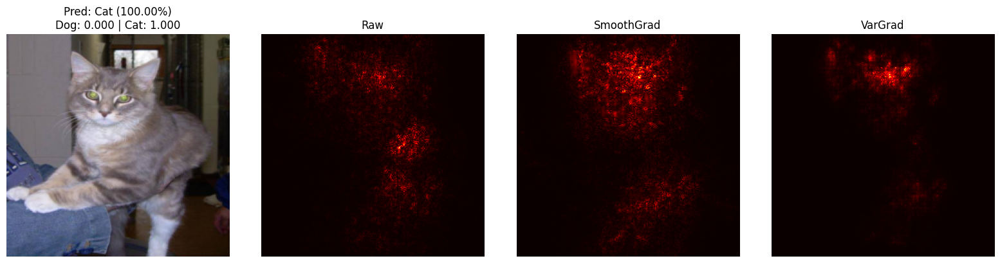


Image 2:
  Dog score: 0.0002
  Cat score: 0.9998
  Prediction: Cat (99.98%)


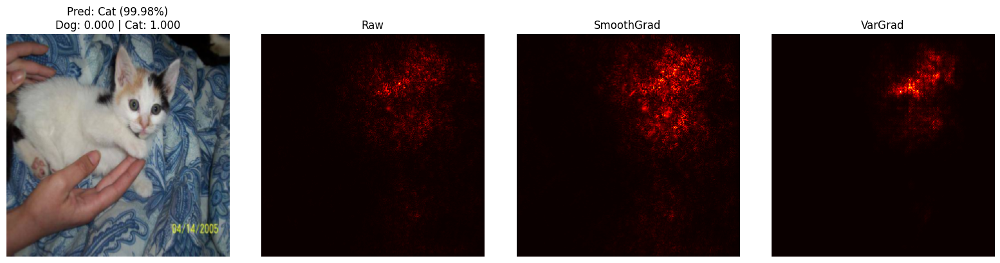


Image 3:
  Dog score: 0.9996
  Cat score: 0.0004
  Prediction: Dog (99.96%)


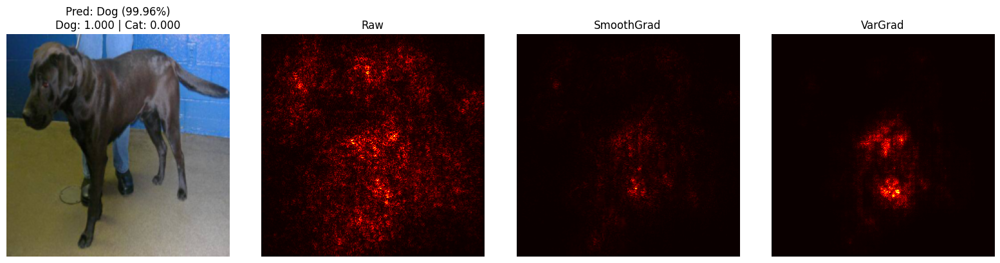


Image 4:
  Dog score: 1.0000
  Cat score: 0.0000
  Prediction: Dog (100.00%)


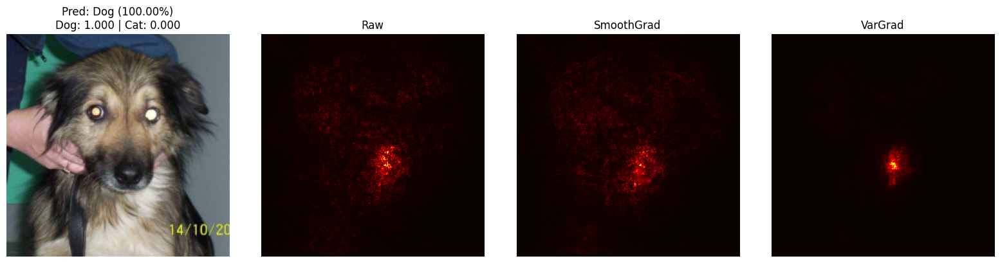


Image 5:
  Dog score: 0.0002
  Cat score: 0.9998
  Prediction: Cat (99.98%)


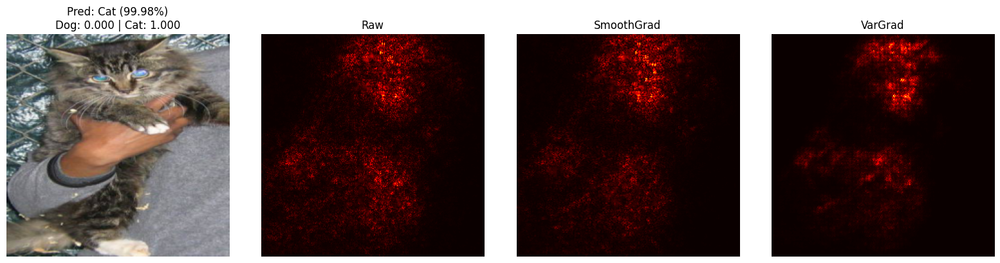

In [ ]:
#Problem 1

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from torch.utils.data import DataLoader, random_split, Dataset
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
from tqdm import tqdm

#Configuration and loading the dataset

DATA_DIR = '/Users/canduki21/Fall-2024-Deep-Learning/data/dogs-vs-cats/train/train'


BATCH_SIZE = 32
NUM_EPOCHS = 1
LEARNING_RATE = 0.001

NUM_TEST_IMAGES = 5
N_SAMPLES = 20
NOISE_LEVEL = 0.15

device = "cpu"

#Set up

class DogsVsCatsDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.images = [f for f in os.listdir(root_dir)
                       if f.endswith(('.jpg', '.jpeg', '.png'))
                       and f.startswith(('dog', 'cat'))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        img_path = os.path.join(self.root_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        label = 0 if img_name.startswith("dog") else 1

        if self.transform:
            image = self.transform(image)

        return image, label


train_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],
                         [0.229,0.224,0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],
                         [0.229,0.224,0.225])
])

full_dataset = DogsVsCatsDataset(DATA_DIR, transform=train_transform)

train_size = int(0.8 * len(full_dataset))
test_size = len(full_dataset) - train_size

train_dataset, test_dataset = random_split(full_dataset,
                                           [train_size, test_size])

train_loader = DataLoader(train_dataset,
                          batch_size=BATCH_SIZE,
                          shuffle=True)

print("Train size:", len(train_dataset))
print("Test size:", len(test_dataset))

#Model set up
model = models.resnet18(weights="IMAGENET1K_V1")
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

#Training of the model

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

model.train()
for epoch in range(NUM_EPOCHS):
    correct = 0
    total = 0

    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        _, pred = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (pred == labels).sum().item()

    print(f"Epoch {epoch+1} Accuracy: {100*correct/total:.2f}%")


    
torch.save(model.state_dict(), 'dogs_vs_cats_model.pth')
print("Model saved to dogs_vs_cats_model.pth")


#Postprocessing: absolute value + channel mean + normalization

def compute_gradient(model, image, target_class):
    image = image.clone().detach().requires_grad_(True)
    output = model(image)
    score = output[0, target_class]

    model.zero_grad()
    score.backward()

    return image.grad[0].cpu()


def smoothgrad(model, image, target_class):
    grads = []

    for _ in range(N_SAMPLES):
        noise = torch.randn_like(image) * NOISE_LEVEL
        noisy_image = (image + noise).clone().detach().requires_grad_(True)

        output = model(noisy_image)
        score = output[0, target_class]

        model.zero_grad()
        score.backward()

        grads.append(noisy_image.grad[0].cpu())

    return torch.mean(torch.stack(grads), dim=0)


def vargrad(model, image, target_class):
    grads = []

    for _ in range(N_SAMPLES):
        noise = torch.randn_like(image) * NOISE_LEVEL
        noisy_image = (image + noise).clone().detach().requires_grad_(True)

        output = model(noisy_image)
        score = output[0, target_class]

        model.zero_grad()
        score.backward()

        grads.append(noisy_image.grad[0].cpu())

    grads = torch.stack(grads)
    return torch.var(grads, dim=0)


#Data visualization

def process_grad(grad):
    grad = torch.abs(grad)
    grad = grad.mean(dim=0)
    grad = (grad - grad.min())/(grad.max()-grad.min()+1e-8)
    return grad.numpy()

def denormalize(img):
    mean = torch.tensor([0.485,0.456,0.406]).view(3,1,1)
    std = torch.tensor([0.229,0.224,0.225]).view(3,1,1)
    img = img.cpu()*std + mean
    return torch.clamp(img,0,1).permute(1,2,0).numpy()


model.eval()

#Explanation

count = 0
for image, label in test_dataset:
    image_input = image.unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(image_input)
        pred = output.argmax(dim=1).item()
        probs = torch.softmax(output, dim=1)[0]
        conf = probs[pred].item()
        dog_score = probs[0].item()
        cat_score = probs[1].item()
    
    print(f"\nImage {count+1}:")
    print(f"  Dog score: {dog_score:.4f}")
    print(f"  Cat score: {cat_score:.4f}")
    print(f"  Prediction: {['Dog','Cat'][pred]} ({conf:.2%})")

    raw = compute_gradient(model, image_input, pred)
    smooth = smoothgrad(model, image_input, pred)
    var = vargrad(model, image_input, pred)

    fig, axes = plt.subplots(1,4,figsize=(16,4))

    axes[0].imshow(denormalize(image))
    axes[0].set_title(f"Pred: {['Dog','Cat'][pred]} ({conf:.2%})\nDog: {dog_score:.3f} | Cat: {cat_score:.3f}")
    axes[0].axis("off")

    for ax, grad, title in zip(
        axes[1:],
        [raw, smooth, var],
        ["Raw", "SmoothGrad", "VarGrad"]
    ):
        ax.imshow(process_grad(grad), cmap="hot")
        ax.set_title(title)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

    count += 1
    if count == NUM_TEST_IMAGES:
        break

The raw gradient maps look pretty messy. There are bright spots all over the image, even in the background, so it’s hard to tell exactly what the model is paying attention to. You can see some activation around important areas like the eyes and face, but it’s mixed in with a lot of random noise.

SmoothGrad makes things much clearer. The heatmaps look smoother and more focused on the main parts of the animal, especially the eyes, nose, and head shape. There’s less activity in the background, so it’s easier to see what actually matters for the prediction. 

VarGrad focuses on the areas where the gradients change the most when noise is added. In the images, this usually shows up as stronger, more concentrated spots around key features like the eyes, face and nose. Overall, SmoothGrad and VarGrad make it much easier to understand what the model is using compared to the raw gradients, which look noisy and scattered.

------

### Problem 2. Incorrect Predictions and Competing Explanations (5 points)

Select at least five test images that your model classifies incorrectly.

a. For each image, compute explanations for both the predicted-class score and the ground-truth-class score using raw gradients, SmoothGrad, and VarGrad.

b. Visualize and compare the explanations for the two scalar outputs on the same image.

c. Analyze how the explanations differ between the predicted and true class scores, and what this comparison suggests about why the model failed.


Test size: 5001
Loaded trained model weights

Incorrect Image 1:
  Ground Truth: Cat (score: 0.1622)
  Predicted: Dog (score: 0.8378)
  Dog score: 0.8378
  Cat score: 0.1622


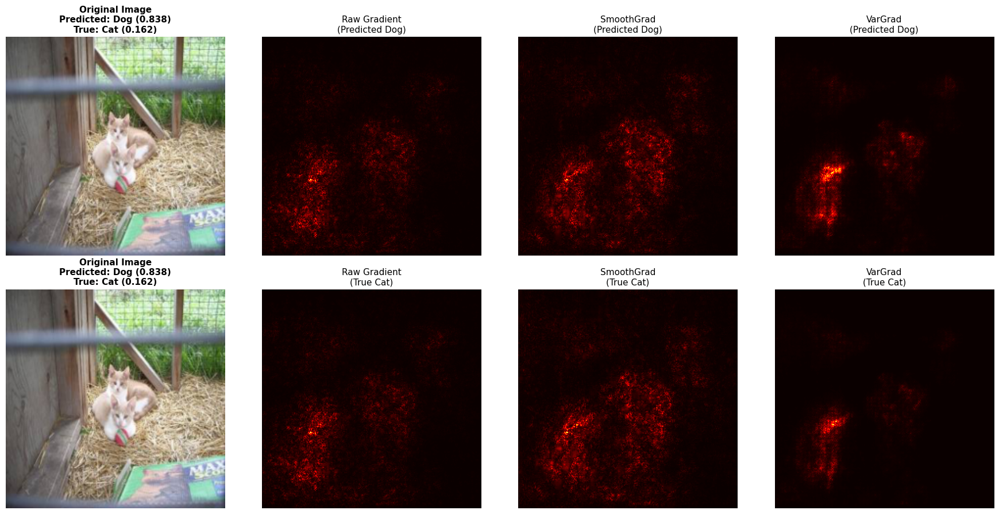


Incorrect Image 2:
  Ground Truth: Dog (score: 0.2288)
  Predicted: Cat (score: 0.7712)
  Dog score: 0.2288
  Cat score: 0.7712


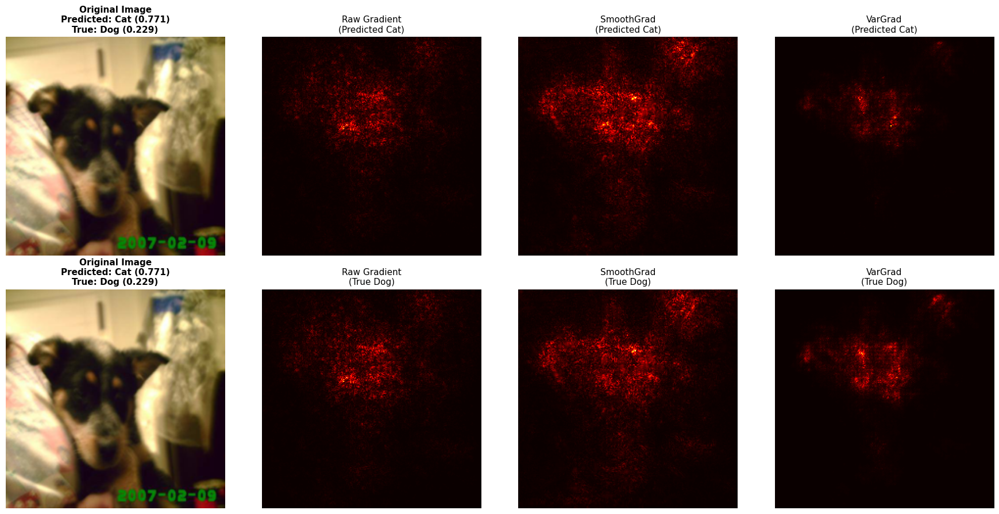


Incorrect Image 3:
  Ground Truth: Dog (score: 0.2595)
  Predicted: Cat (score: 0.7405)
  Dog score: 0.2595
  Cat score: 0.7405


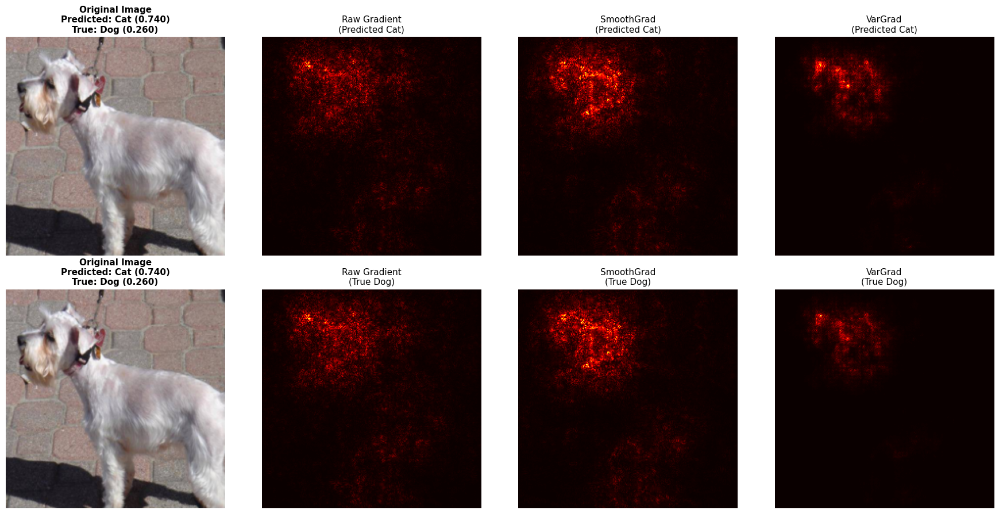


Incorrect Image 4:
  Ground Truth: Cat (score: 0.0023)
  Predicted: Dog (score: 0.9977)
  Dog score: 0.9977
  Cat score: 0.0023


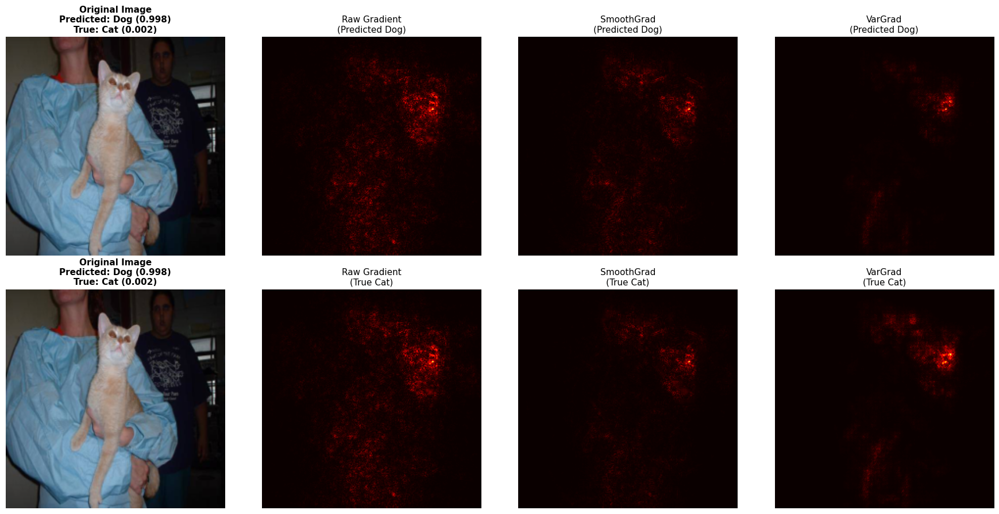


Incorrect Image 5:
  Ground Truth: Cat (score: 0.3515)
  Predicted: Dog (score: 0.6485)
  Dog score: 0.6485
  Cat score: 0.3515


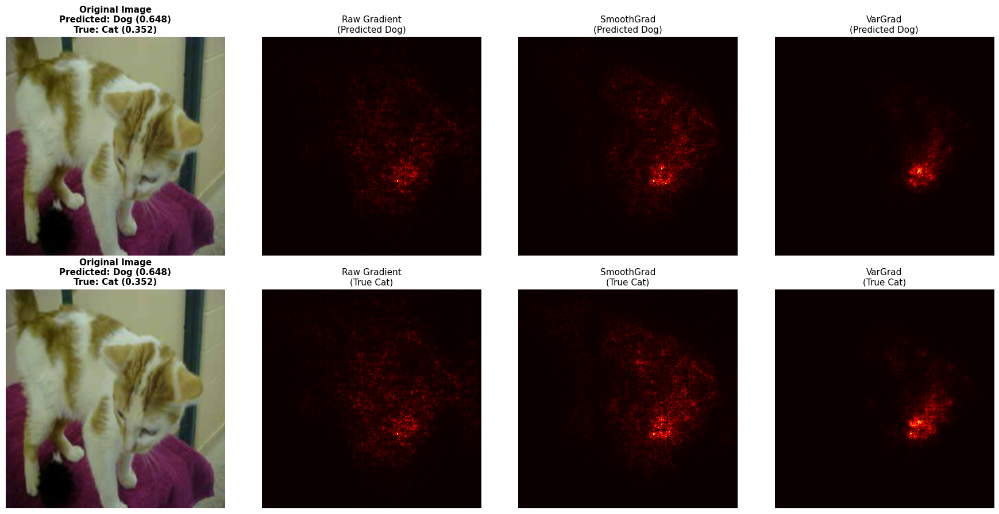

In [ ]:
#Problem 2

import torch
import torch.nn as nn
from torchvision import transforms, models
from torch.utils.data import DataLoader, random_split, Dataset
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

# Configuration of database

DATA_DIR = '/Users/canduki21/Fall-2024-Deep-Learning/data/dogs-vs-cats/train/train'

BATCH_SIZE = 32
NUM_INCORRECT_IMAGES = 5
N_SAMPLES = 20
NOISE_LEVEL = 0.15

device = "cpu"

#Database set up

class DogsVsCatsDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.images = [f for f in os.listdir(root_dir)
                       if f.endswith(('.jpg', '.jpeg', '.png'))
                       and f.startswith(('dog', 'cat'))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        img_path = os.path.join(self.root_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        label = 0 if img_name.startswith("dog") else 1

        if self.transform:
            image = self.transform(image)

        return image, label


test_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],
                         [0.229,0.224,0.225])
])

full_dataset = DogsVsCatsDataset(DATA_DIR, transform=test_transform)

train_size = int(0.8 * len(full_dataset))
test_size = len(full_dataset) - train_size

train_dataset, test_dataset = random_split(full_dataset,
                                           [train_size, test_size])

print("Test size:", len(test_dataset))

#Model set up

model = models.resnet18(weights="IMAGENET1K_V1")
model.fc = nn.Linear(model.fc.in_features, 2)

#Loading the trained model
model.load_state_dict(torch.load('dogs_vs_cats_model.pth', map_location=device))
model = model.to(device)
model.eval()

print("Loaded trained model weights")

# Explanation
def compute_gradient(model, image, target_class):
    image = image.clone().detach().requires_grad_(True)
    output = model(image)
    score = output[0, target_class]

    model.zero_grad()
    score.backward()

    return image.grad[0].cpu()


def smoothgrad(model, image, target_class):
    grads = []

    for _ in range(N_SAMPLES):
        noise = torch.randn_like(image) * NOISE_LEVEL
        noisy_image = (image + noise).clone().detach().requires_grad_(True)

        output = model(noisy_image)
        score = output[0, target_class]

        model.zero_grad()
        score.backward()

        grads.append(noisy_image.grad[0].cpu())

    return torch.mean(torch.stack(grads), dim=0)


def vargrad(model, image, target_class):
    grads = []

    for _ in range(N_SAMPLES):
        noise = torch.randn_like(image) * NOISE_LEVEL
        noisy_image = (image + noise).clone().detach().requires_grad_(True)

        output = model(noisy_image)
        score = output[0, target_class]

        model.zero_grad()
        score.backward()

        grads.append(noisy_image.grad[0].cpu())

    grads = torch.stack(grads)
    return torch.var(grads, dim=0)


# Data visualization
def process_grad(grad):
    grad = torch.abs(grad)
    grad = grad.mean(dim=0)
    grad = (grad - grad.min())/(grad.max()-grad.min()+1e-8)
    return grad.numpy()

def denormalize(img):
    mean = torch.tensor([0.485,0.456,0.406]).view(3,1,1)
    std = torch.tensor([0.229,0.224,0.225]).view(3,1,1)
    img = img.cpu()*std + mean
    return torch.clamp(img,0,1).permute(1,2,0).numpy()




incorrect_images = []
for image, label in test_dataset:
    if len(incorrect_images) >= NUM_INCORRECT_IMAGES:
        break
    
    image_input = image.unsqueeze(0).to(device)
    
    with torch.no_grad():
        output = model(image_input)
        pred = output.argmax(dim=1).item()
    
    if pred != label:
        incorrect_images.append((image, label))



count = 0
for image, label in incorrect_images:
    image_input = image.unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(image_input)
        pred = output.argmax(dim=1).item()
        probs = torch.softmax(output, dim=1)[0]
        pred_score = probs[pred].item()
        true_score = probs[label].item()
        dog_score = probs[0].item()
        cat_score = probs[1].item()
    
    print(f"\n{'='*60}")
    print(f"Incorrect Image {count+1}:")
    print(f"  Ground Truth: {['Dog','Cat'][label]} (score: {true_score:.4f})")
    print(f"  Predicted: {['Dog','Cat'][pred]} (score: {pred_score:.4f})")
    print(f"  Dog score: {dog_score:.4f}")
    print(f"  Cat score: {cat_score:.4f}")
    print('='*60)

    #Explanations PREDICTED class
    
    raw_pred = compute_gradient(model, image_input, pred)
    smooth_pred = smoothgrad(model, image_input, pred)
    var_pred = vargrad(model, image_input, pred)
    
    #Explanations for TRUE class
    
    raw_true = compute_gradient(model, image_input, label)
    smooth_true = smoothgrad(model, image_input, label)
    var_true = vargrad(model, image_input, label)

    # Create visualization comparing predicted vs true class explanations
    fig, axes = plt.subplots(2, 4, figsize=(18, 9))
    
    
    axes[0, 0].imshow(denormalize(image))
    axes[0, 0].set_title(f"Original Image\nPredicted: {['Dog','Cat'][pred]} ({pred_score:.3f})\nTrue: {['Dog','Cat'][label]} ({true_score:.3f})", 
                         fontsize=11, fontweight='bold')
    axes[0, 0].axis("off")
    
    axes[0, 1].imshow(process_grad(raw_pred), cmap="hot")
    axes[0, 1].set_title(f"Raw Gradient\n(Predicted {['Dog','Cat'][pred]})", fontsize=11)
    axes[0, 1].axis("off")
    
    axes[0, 2].imshow(process_grad(smooth_pred), cmap="hot")
    axes[0, 2].set_title(f"SmoothGrad\n(Predicted {['Dog','Cat'][pred]})", fontsize=11)
    axes[0, 2].axis("off")
    
    axes[0, 3].imshow(process_grad(var_pred), cmap="hot")
    axes[0, 3].set_title(f"VarGrad\n(Predicted {['Dog','Cat'][pred]})", fontsize=11)
    axes[0, 3].axis("off")
    
    
    axes[1, 0].imshow(denormalize(image))
    axes[1, 0].set_title(f"Original Image\nPredicted: {['Dog','Cat'][pred]} ({pred_score:.3f})\nTrue: {['Dog','Cat'][label]} ({true_score:.3f})", 
                         fontsize=11, fontweight='bold')
    axes[1, 0].axis("off")
    
    axes[1, 1].imshow(process_grad(raw_true), cmap="hot")
    axes[1, 1].set_title(f"Raw Gradient\n(True {['Dog','Cat'][label]})", fontsize=11)
    axes[1, 1].axis("off")
    
    axes[1, 2].imshow(process_grad(smooth_true), cmap="hot")
    axes[1, 2].set_title(f"SmoothGrad\n(True {['Dog','Cat'][label]})", fontsize=11)
    axes[1, 2].axis("off")
    
    axes[1, 3].imshow(process_grad(var_true), cmap="hot")
    axes[1, 3].set_title(f"VarGrad\n(True {['Dog','Cat'][label]})", fontsize=11)
    axes[1, 3].axis("off")
    
    
    plt.tight_layout()
    
    plt.show()

    count += 1


When comparing the explanations for the predicted and true class scores, the heatmaps look very similar in many cases. Both the predicted-class and true-class explanations often highlight the same general regions of the image, especially around the animals’ faces and central features. This suggests that the model is not completely focusing on the wrong object. Instead, it seems to be paying attention to similar visual features for both classes. However, the model still makes incorrect predictions. A likely reason is that many of the images contain multiple cats together, unusual positions, or even human faces in the frame. These additional elements may confuse the model, especially if it relies heavily on facial features or textures that overlap between classes. The presence of multiple animals or human faces may shift the model’s confidence slightly toward the wrong class, even though it is looking at roughly the same areas. This suggests that the failure is not due to attention on completely irrelevant regions, but rather due to ambiguity in the scene and overlapping visual cues that make the classification more difficult.

----

### Problem 3. Multi-Target Explanations in Multi-Animal Scenes (5 points)

Find three images online with the following properties:

1. One image that contains both a dog and a cat.
2. One image that contains multiple dogs and/or multiple cats.
3. One image of your choice that you believe will be challenging or interesting for explanation (e.g., occlusion, unusual pose, ??)

Record the source URL for each image.

a. For each image, compute SmoothGrad explanations for both the dog-class score and the cat-class score, and visualize them separately.

b. For each image, produce a combined visualization in which both explanations are overlaid on the same image using different colormaps. You may suppress low-magnitude regions if desired, but must state the rule used.

c. Compare the three images. Discuss how explanation localization and overlap differ across the cases, and what this reveals about the limitations of differential explanations in multi-object scenes.


Dog score: 0.5736, Cat score: 0.4264


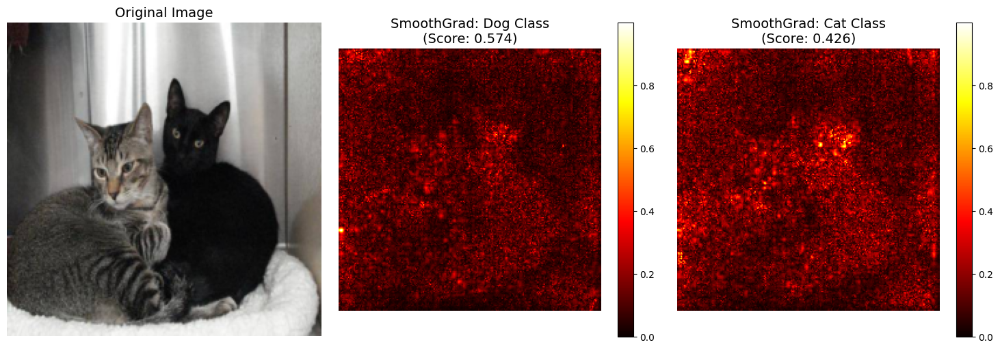

Dog score: 0.5735, Cat score: 0.4265


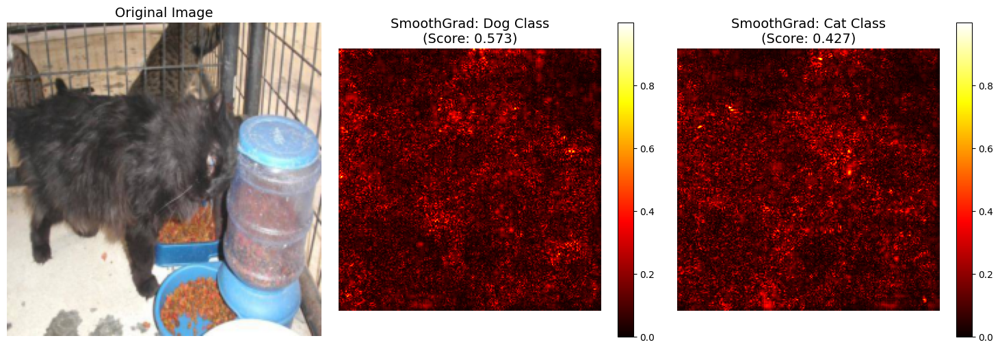

Dog score: 0.5719, Cat score: 0.4281


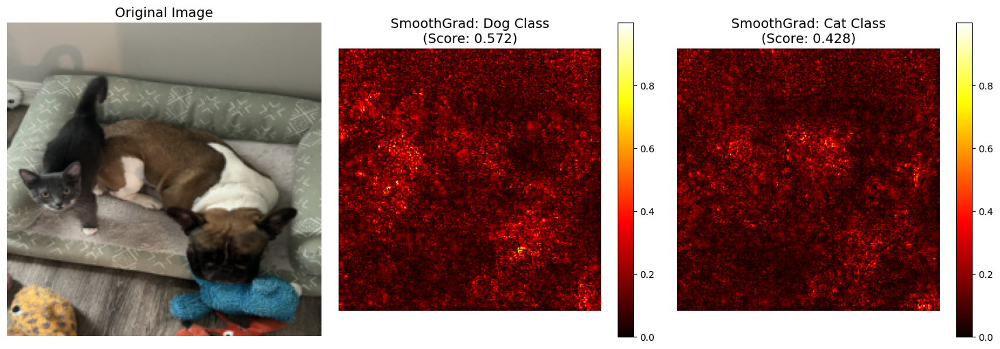


Processing: multi_cats


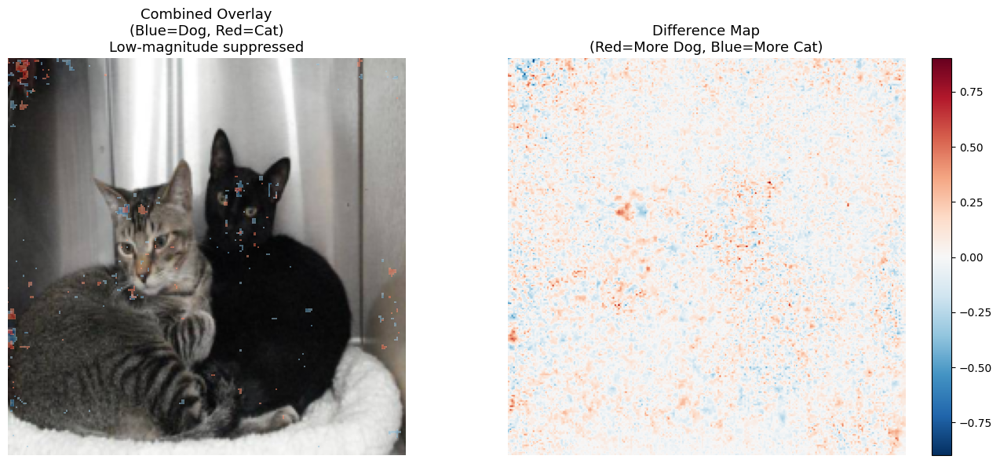


Processing: occluded_cat


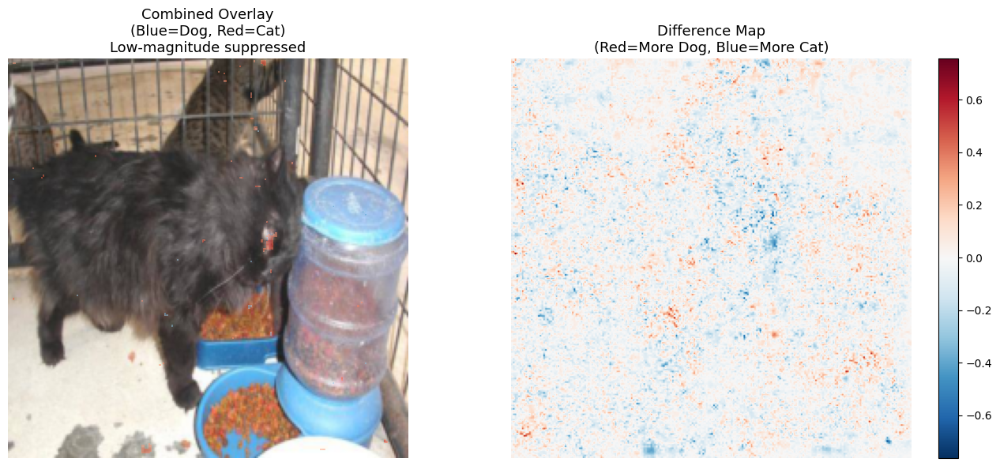


Processing: dog_and_cat


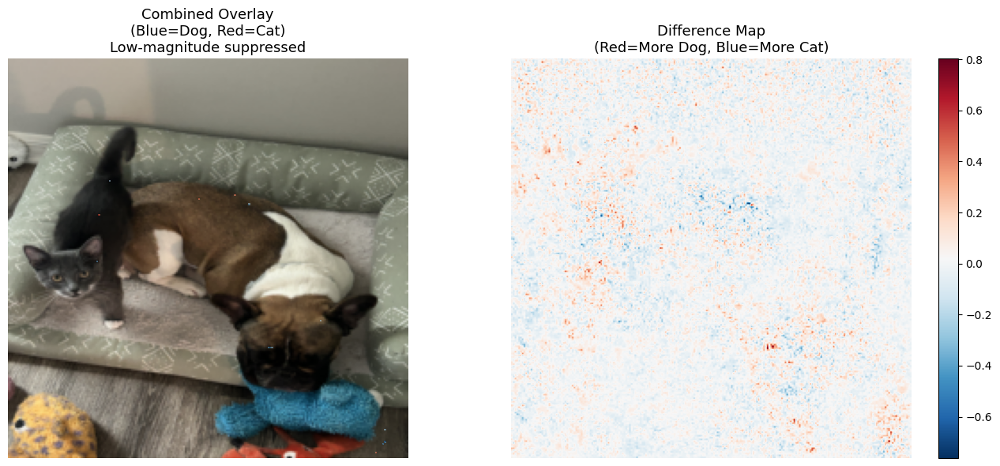

In [ ]:
#Problem 3

import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

#Configuration

DATA_DIR = '/Users/canduki21/Fall-2024-Deep-Learning/data/dogs-vs-cats/train/train'

# Two images from the dataset; the cat&dog is my own car and dog!!
image_paths = {
    "multi_cats": f"{DATA_DIR}/cat.8.jpg",
    "occluded_cat": f"{DATA_DIR}/cat.96.jpg", 
    "dog_and_cat": f"{DATA_DIR}/cat&dog.jpg"
}

N_SAMPLES = 50
NOISE_LEVEL = 0.15
device = "cpu"


model = models.resnet18(weights="IMAGENET1K_V1")
model.fc = nn.Linear(model.fc.in_features, 2)  
model = model.to(device)

test_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],
                         [0.229,0.224,0.225])
])

#Smoothgrad

def smoothgrad(model, image, target_class):
    """Compute SmoothGrad for a specific target class"""
    grads = []
    
    for _ in range(N_SAMPLES):
        noise = torch.randn_like(image) * NOISE_LEVEL
        noisy_image = (image + noise).clone().detach().requires_grad_(True)
        
        output = model(noisy_image)
        score = output[0, target_class]
        
        model.zero_grad()
        score.backward()
        
        grads.append(noisy_image.grad[0].cpu())
    
    return torch.mean(torch.stack(grads), dim=0)

#Visualization

def process_grad(grad):
    """Postprocessing: absolute value + channel mean + normalization"""
    grad = torch.abs(grad)
    grad = grad.mean(dim=0)
    grad = (grad - grad.min())/(grad.max()-grad.min()+1e-8)
    return grad.numpy()

def denormalize(img):
    """Denormalize image for display"""
    mean = torch.tensor([0.485,0.456,0.406]).view(3,1,1)
    std = torch.tensor([0.229,0.224,0.225]).view(3,1,1)
    img = img.cpu()*std + mean
    return torch.clamp(img,0,1).permute(1,2,0).numpy()




for name, path in image_paths.items():
    
    
   
    img = Image.open(path).convert('RGB')
    img_tensor = test_transform(img).unsqueeze(0).to(device)
    
    # Get predictions
    with torch.no_grad():
        output = model(img_tensor)
        probs = torch.softmax(output, dim=1)[0]
        dog_score = probs[0].item()
        cat_score = probs[1].item()
    
    print(f"Dog score: {dog_score:.4f}, Cat score: {cat_score:.4f}")
    
    # Compute SmoothGrad for both classes

    smoothgrad_dog = smoothgrad(model, img_tensor, target_class=0)
    
    
    smoothgrad_cat = smoothgrad(model, img_tensor, target_class=1)
    
    # Process gradients
    attr_dog = process_grad(smoothgrad_dog)
    attr_cat = process_grad(smoothgrad_cat)
 
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(denormalize(img_tensor[0]))
    axes[0].set_title('Original Image', fontsize=14)
    axes[0].axis('off')
    
    im1 = axes[1].imshow(attr_dog, cmap='hot')
    axes[1].set_title(f'SmoothGrad: Dog Class\n(Score: {dog_score:.3f})', fontsize=14)
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1])
    
    im2 = axes[2].imshow(attr_cat, cmap='hot')
    axes[2].set_title(f'SmoothGrad: Cat Class\n(Score: {cat_score:.3f})', fontsize=14)
    axes[2].axis('off')
    plt.colorbar(im2, ax=axes[2])
    
    plt.tight_layout()
    plt.savefig(f'{name}_separate.png', dpi=150, bbox_inches='tight')
    plt.show()

# Colormaps

for name, path in image_paths.items():
    print(f"\nProcessing: {name}")
    
    
    img = Image.open(path).convert('RGB')
    img_tensor = test_transform(img).unsqueeze(0).to(device)
    
    
    with torch.no_grad():
        output = model(img_tensor)
        probs = torch.softmax(output, dim=1)[0]
    
    
    smoothgrad_dog = smoothgrad(model, img_tensor, target_class=0)
    smoothgrad_cat = smoothgrad(model, img_tensor, target_class=1)
    
    
    attr_dog = process_grad(smoothgrad_dog)
    attr_cat = process_grad(smoothgrad_cat)
    
  
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Overlay with different colormaps 
    axes[0].imshow(denormalize(img_tensor[0]))
    
    dog_masked = np.ma.masked_where(attr_dog < 0.3, attr_dog)
    cat_masked = np.ma.masked_where(attr_cat < 0.3, attr_cat)
    axes[0].imshow(dog_masked, cmap='Blues', alpha=0.5, vmin=0, vmax=1)
    axes[0].imshow(cat_masked, cmap='Reds', alpha=0.5, vmin=0, vmax=1)
    axes[0].set_title('Combined Overlay\n(Blue=Dog, Red=Cat)', fontsize=13)
    axes[0].axis('off')
    
    # Difference map
    attr_diff = attr_dog - attr_cat
    im = axes[1].imshow(attr_diff, cmap='RdBu_r')
    axes[1].set_title('Difference Map\n(Red=More Dog, Blue=More Cat)', fontsize=13)
    axes[1].axis('off')
    plt.colorbar(im, ax=axes[1])
    
    plt.tight_layout()
    plt.savefig(f'{name}_combined.png', dpi=150, bbox_inches='tight')
    plt.show()



For all three images the model gave almost the same score for dog and cat ~ 0.500 each. That basically means the model is completely unsure. A 50/50 split means it doesn’t have stronger evidence for one class over the other, so the prediction is kind of like flipping a coin. The image is sitting right on the decision boundary, where the model sees features that support both classes equally and can’t choose one.

This happens especially in more complicated scenes. In the dog_and_cat image, both animals are present, so features for dogs and cats activate at the same time, and they sort of cancel each other out. The model was trained as a binary classifier (dog OR cat), so it can’t properly say “both.” In the occluded_cat image, part of the animal is hidden, so the model doesn’t get enough clear features to be confident. Even in multi_cats, having several animals in different positions might confuse the model or spread out the signals. The SmoothGrad maps reflect this uncertainty — when the red and blue regions overlap or mix, it shows that both classes are being supported at the same time. Overall, this highlights a limitation of simple binary classifiers when dealing with real-world images.